# **Lab: Color Image Processing**

## **1. Introduction**
**Motivation:**
While the human eye can only distinguish about two dozen shades of gray, it can differentiate thousands of distinct colors. This makes color a powerful descriptor for object identification and extraction.

**Scope of this Lab:**
1.  **Color Fundamentals:** Understanding RGB and CMY spaces.
2.  **Color Models:** Converting between RGB, HSI, and CMYK.
3.  **Pseudo-Coloring:** Intensity Slicing to visualize grayscale data.
4.  **Color Transformations:** Modifying specific color components.
5.  **Spatial Filtering:** Smoothing and Sharpening color images.

### **Prerequisites**
We will use `OpenCV` for image processing and `Matplotlib` for visualization.

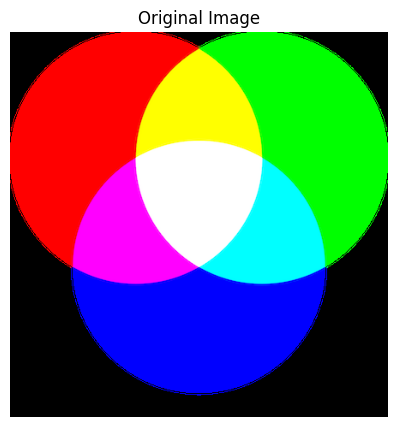

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Helper function to display images side-by-side
def show_images(images, titles, cmap='gray'):
    n = len(images)
    plt.figure(figsize=(15, 5))
    for i in range(n):
        plt.subplot(1, n, i+1)
        # Check if image is grayscale or color
        if len(images[i].shape) == 2:
            plt.imshow(images[i], cmap='gray')
        else:
            # Convert BGR (OpenCV default) to RGB (Matplotlib default)
            plt.imshow(cv2.cvtColor(images[i], cv2.COLOR_BGR2RGB))
        plt.title(titles[i])
        plt.axis('off')
    plt.show()

original_img = cv2.imread('colors.png')
show_images([original_img], ["Original Image"])

## **2. The RGB Color Model**

**Concept:**
RGB is an **Additive Color Model** used in monitors and cameras.
* It uses three primary colors: **Red**, **Green**, and **Blue**.
* Combining all three produces **White**.
* **Pixel Depth:** Standard images use 8 bits per channel, resulting in 24-bit color depth ($2^{24} \approx 16.7$ million colors).

In this section, we will visualize the individual channels. Notice that in the **Red Channel**, the red objects appear **White** (high intensity, 255).

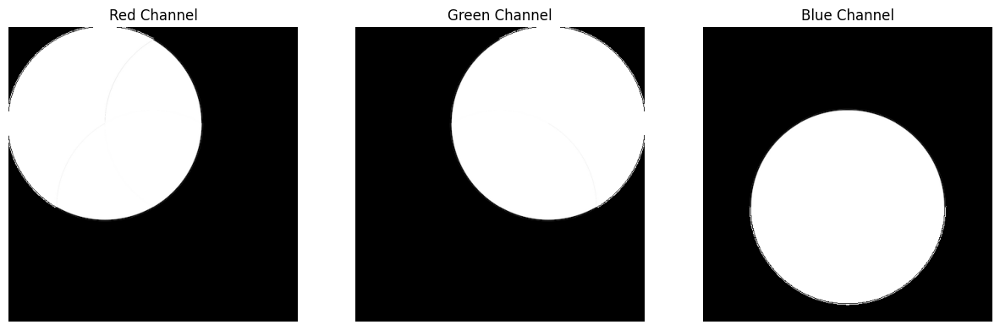

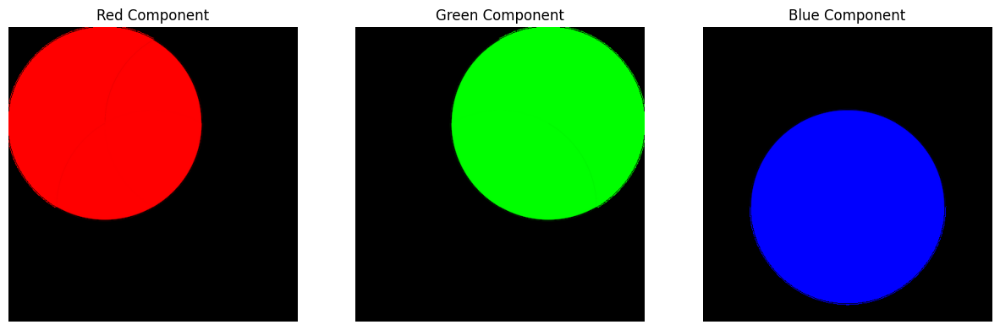

In [38]:
# Split the image into components
# Note: OpenCV stores images as BGR, not RGB
B, G, R = cv2.split(original_img)

# Display channels as grayscale intensity maps
# In the 'Red' plot, bright white areas indicate high red content
show_images([R, G, B], ["Red Channel", "Green Channel", "Blue Channel"])

# Visualize as actual colored layers
zeros = np.zeros_like(R)
img_R = cv2.merge([zeros, zeros, R]) # Only Red component
img_G = cv2.merge([zeros, G, zeros]) # Only Green component
img_B = cv2.merge([B, zeros, zeros]) # Only Blue component

show_images([img_R, img_G, img_B], ["Red Component", "Green Component", "Blue Component"])

## **3. CMY and CMYK Models**

**Concept:**
CMY is a **Subtractive Color Model** used in printing (pigments).
* **C**yan absorbs Red.
* **M**agenta absorbs Green.
* **Y**ellow absorbs Blue.

**Mathematical Conversion:**
To convert from RGB to CMY (assuming normalized values [0, 1]):
$$
\begin{bmatrix} C \\ M \\ Y \end{bmatrix} = \begin{bmatrix} 1 \\ 1 \\ 1 \end{bmatrix} - \begin{bmatrix} R \\ G \\ B \end{bmatrix}
$$


**CMYK:** Adds Black ($K$) because mixing C, M, and Y paints often results in a muddy brown rather than pure black.
$$K = 1 - \max(R, G, B)$$

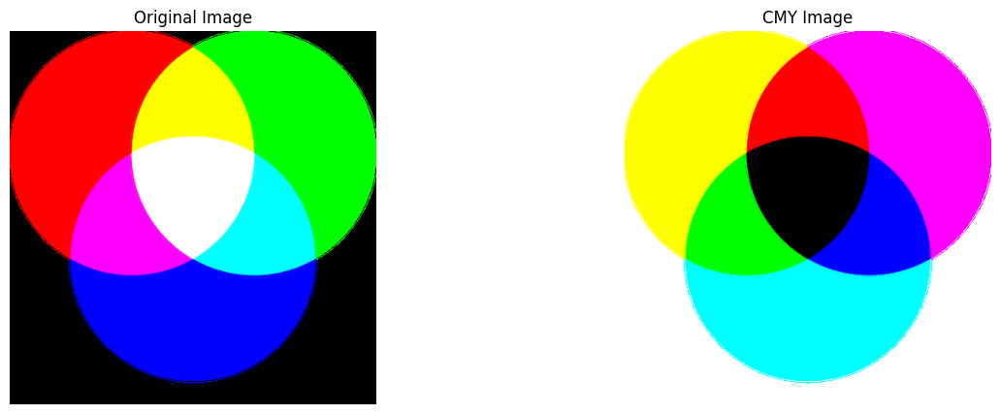

In [39]:
# Normalize image to range [0, 1] for calculation
img_float = original_img.astype(float) / 255.0

# Extract channels (Remember BGR order in OpenCV)
b_float, g_float, r_float = cv2.split(img_float)

# Calculate CMY
# Cyan = 1 - Red
C = 1.0 - r_float
# Magenta = 1 - Green
M = 1.0 - g_float
# Yellow = 1 - Blue
Y = 1.0 - b_float
zeros = np.zeros_like(C)
# Merge to create color representations
cmy_image = cv2.merge([C, M, Y])
# Visualize

# Show orginal and cmy images
show_images([original_img, (cmy_image * 255).astype(np.uint8)], ["Original Image", "CMY Image"])

## **4. The HSI Color Model**

**Motivation:**
RGB is ideal for hardware, but **HSI (Hue, Saturation, Intensity)** matches how humans perceive color.
* **Hue (H):** The pure color (e.g., Red, Yellow). Measured in degrees [0, 360].
* **Saturation (S):** The purity of the color (how much white is mixed in).
* **Intensity (I):** The brightness (achromatic).

**Formulas:**
The Intensity is simply the average of RGB:
$$I = \frac{1}{3}(R + G + B)$$

The Saturation is inversely proportional to the minimum RGB component:
$$S = 1 - \frac{3}{(R+G+B)}[\min(R, G, B)]$$

The Hue is calculated using the angle $\theta$:
$$\theta = \cos^{-1} \left\{ \frac{\frac{1}{2}[(R-G) + (R-B)]}{[(R-G)^2 + (R-B)(G-B)]^{1/2}} \right\}$$
$$H = \theta \text{ if } B \le G, \quad H = 360 - \theta \text{ if } B > G$$


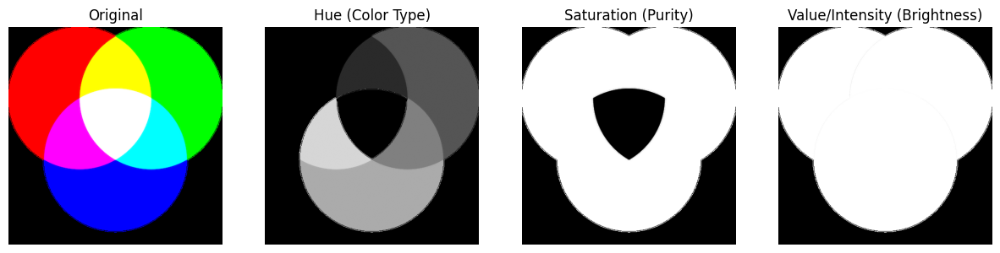

In [40]:
# While we can implement the math manually, OpenCV provides optimized functions.
# HSV (Hue, Saturation, Value) is very similar to HSI and commonly used in labs.

# Convert to HSV
hsv_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2HSV)

# Split channels
H, S, V = cv2.split(hsv_img)

# Display
# Note: In OpenCV, Hue is [0, 179], Saturation [0, 255], Value [0, 255]
show_images([original_img, H, S, V], 
            ["Original", "Hue (Color Type)", "Saturation (Purity)", "Value/Intensity (Brightness)"])

## Another Example of RGB to HSI conversion

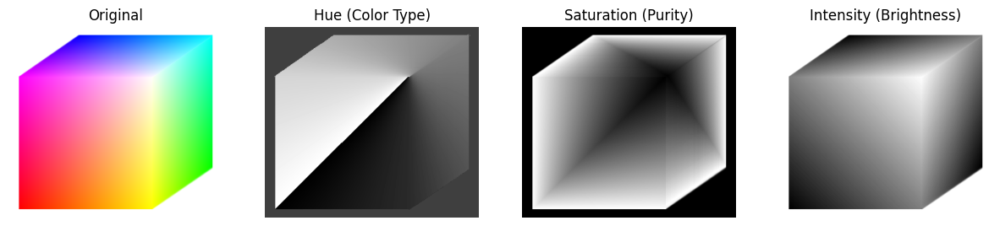

In [5]:
image = cv2.imread('Images\Fig0608(RGB-full-color-cube).tif')
hsv_img = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Our custom RGB to HSI conversion function
def rgb2hsi (image):
  
  b, g, r = cv2.split(image.astype(float) / 255.0)
  # H
  numerator = ((r-g) + (r-b)) / 2
  denominator = np.sqrt(((np.power(r-g,2))+((r-b)*(g-b))))
  theta = numerator / (denominator + 0.0000001)
  theta = np.degrees(np.arccos(theta))
  h = np.zeros_like(theta)
  h[b <= g] = theta[b <= g]
  h[b > g] = 360 - theta[b > g]
  h = (h / 360) * 255

  # S
  denominator = r + g + b
  min_rgb = np.minimum.reduce([r,g,b])
  s = (1 - (3 / denominator) * min_rgb) * 255

  # I
  i = ((r + g + b) / 3) * 255

  return [h,s,i]

h, s, i = rgb2hsi(image)

# Display
show_images([image, h.astype(np.uint8), s.astype(np.uint8), i.astype(np.uint8)], 
            ["Original", "Hue (Color Type)", "Saturation (Purity)", "Intensity (Brightness)"]) 

In [18]:
imgm = cv2.merge([h, s, i])
h=imgm[:,:, 2]

cv2.imshow('hsi', imgm)
cv2.waitKey()
cv2.destroyAllWindows()

### An Example of Converting Image between color models

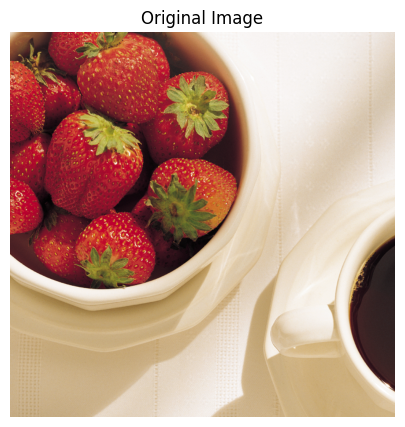

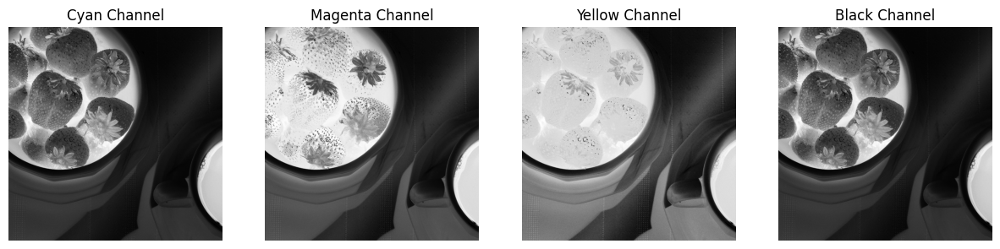

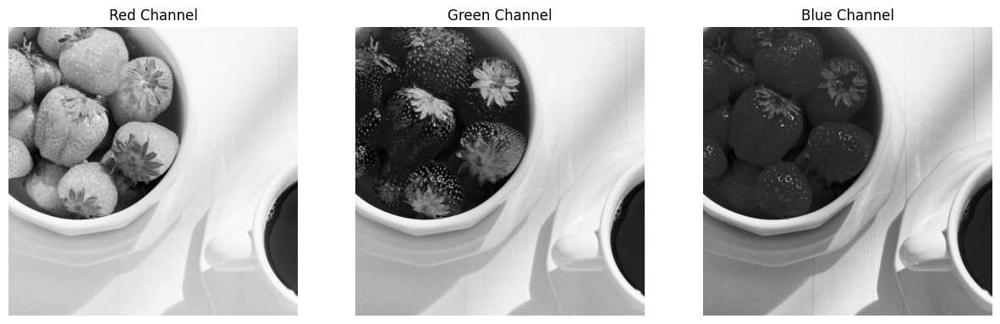

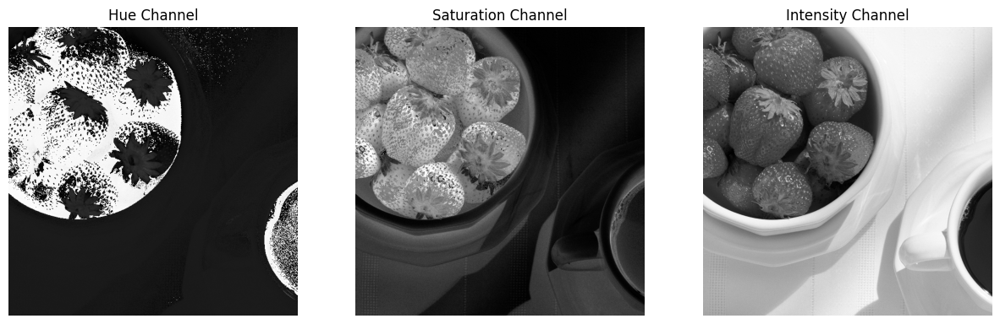

In [42]:
original_image = cv2.imread('Images\Fig0630(01)(strawberries_fullcolor).tif')

# Split channels
B,G,R = cv2.split(original_image)

# Convert to CMYK
# cv2 Don't have built-in CMYK conversion, so we implement it manually
# Normalize image to range [0, 1] for calculation
img_float = original_image.astype(float) / 255.0

# Extract channels (Remember BGR order in OpenCV)
b_float, g_float, r_float = cv2.split(img_float)

# Calculate CMY
# Cyan = 1 - Red
C = 1.0 - r_float
# Magenta = 1 - Green
M = 1.0 - g_float
# Yellow = 1 - Blue
Y = 1.0 - b_float

# Black = min(C, M, Y)
K = np.minimum.reduce([C, M, Y])


# Convert to HSI
H, S, I = rgb2hsi(original_image)

# Show all channels

show_images([original_image], ["Original Image"])
show_images([C, M, Y, K], ["Cyan Channel", "Magenta Channel", "Yellow Channel", "Black Channel"])
show_images([R, G, B], ["Red Channel", "Green Channel", "Blue Channel"])
show_images([H, S, I], ["Hue Channel", "Saturation Channel", "Intensity Channel"])


## **5. Pseudo-Coloring: Intensity Slicing**

**Concept:**
The human eye can distinguish thousands of colors but only about two dozen shades of gray. Pseudo-coloring assigns colors to grayscale intensity values to make details visible.

**Intensity Slicing:**
We map specific ranges of gray levels to specific colors. Ideally, this is done using a **Lookup Table (LUT)**.

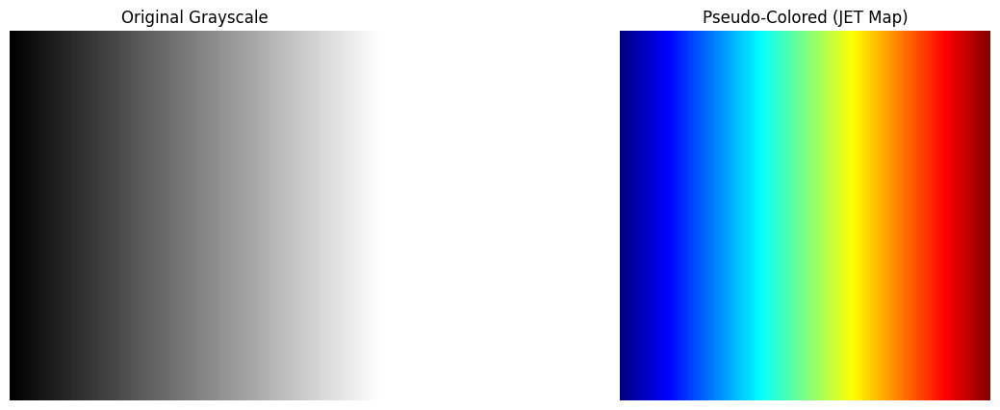

In [43]:
# 1. Create a Grayscale Image (Gradient)
gray_img = np.zeros((200, 200), dtype=np.uint8)
for i in range(200):
    gray_img[:, i] = int(i * (255/200))

# 2. Apply Color Map (Intensity Slicing)
# COLORMAP_JET maps low intensity to Blue, medium to Green, high to Red.
pseudo_color = cv2.applyColorMap(gray_img, cv2.COLORMAP_JET)

show_images([gray_img, pseudo_color], ["Original Grayscale", "Pseudo-Colored (JET Map)"])

#### Manually Adding Color to Gray Scale Image

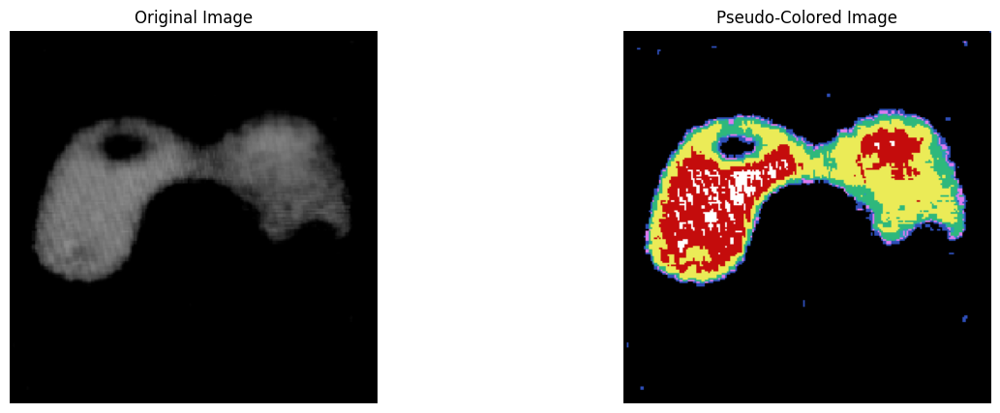

In [2]:
import cv2
import numpy as np

# Read grayscale and color image
gray = cv2.imread('Images/Fig0620(a)(picker_phantom).tif', cv2.IMREAD_GRAYSCALE)
orig = cv2.imread('Images/Fig0620(a)(picker_phantom).tif')

# Define threshold levels
levels = [0, 10, 20, 30, 60, 100, 126]

# Define corresponding colors (BGR)
colors = [
    [184, 78, 46],    # blue
    [240, 122, 220],  # purple
    [184, 154, 46],   # cyan
    [124, 184, 46],   # green
    [87, 235, 235],   # yellow
    [12, 12, 196],    # red
    [255, 255, 255]   # white
]

# Create output image
pseudo = np.zeros_like(orig)

# Apply color mapping by thresholds
for th, col in zip(levels, colors):
    pseudo[gray > th] = col

# Display images
show_images([orig, pseudo], ["Original Image", "Pseudo-Colored Image"])


(220, 217, 3)

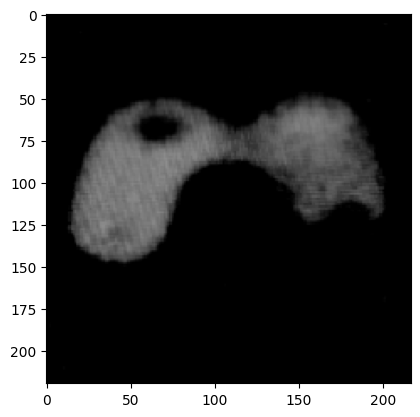

In [4]:
plt.imshow(orig)

orig.shape

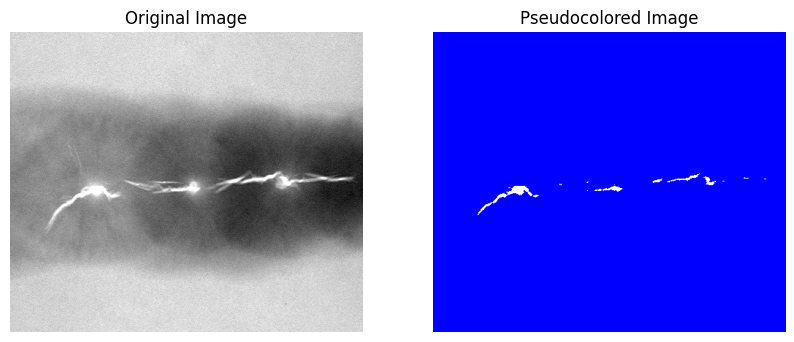

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image (grayscale)
img = cv2.imread(r"Images/Fig0621(a)(weld-original).tif", cv2.IMREAD_GRAYSCALE)

# Convert to 3-channel
coded_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

# Apply pseudocolor:
# If pixel < 254 -> red (BGR: 0,0,255)
# Else -> white (255,255,255)
mask = img < 254
coded_img[mask] = [255, 0, 0]     # red
coded_img[~mask] = [255, 255, 255]  # white

# Plot
fig, ax = plt.subplots(1, 2, figsize=(10, 10))

ax[0].imshow(img, cmap='gray')
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(coded_img[..., ::-1])   # Convert BGR→RGB for Matplotlib
ax[1].set_title("Pseudocolored Image")
ax[1].axis('off')

plt.show()


### Another example of coloring

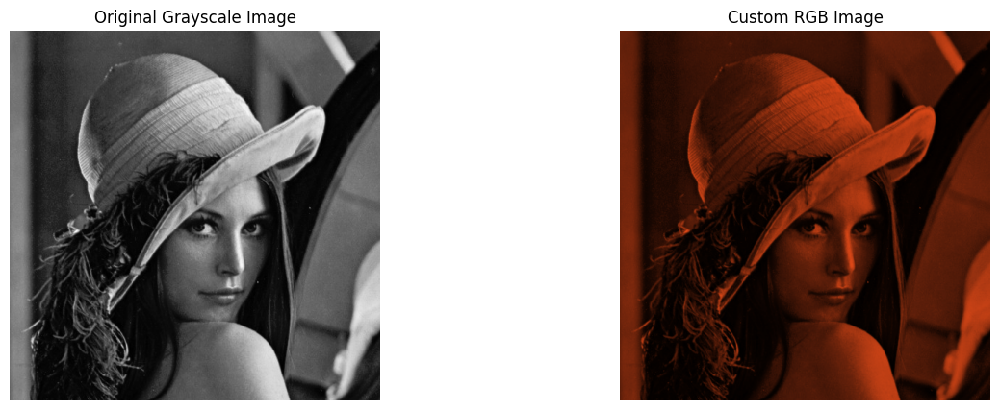

In [46]:
image = cv2.imread('Images\Fig0646(a)(lenna_original_RGB).tif',cv2.IMREAD_GRAYSCALE)

rgb_image = np.zeros((image.shape[0], image.shape[1], 3), dtype=np.uint8)

# BGR order
rgb_image[..., 0] = 0.11 * image  # B channel
rgb_image[..., 1] = 0.33 * image  # G channel
rgb_image[..., 2] = image  # R channel

# show
show_images([image, rgb_image], ["Original Grayscale Image", "Custom RGB Image"])

## **6. Color Transformations & Complements**

We can modify colors directly using transformation functions:
$$g(x,y) = T[f(x,y)]$$

**Color Complements:**
The complement of a color is its opposite on the color wheel. This is useful for enhancing details in dark regions.
$$S_i = 1 - r_i$$
(Equivalent to a photographic negative).

**Tonal Correction:**
Adjusting brightness/contrast by multiplying intensity:
$$S = k \cdot r$$

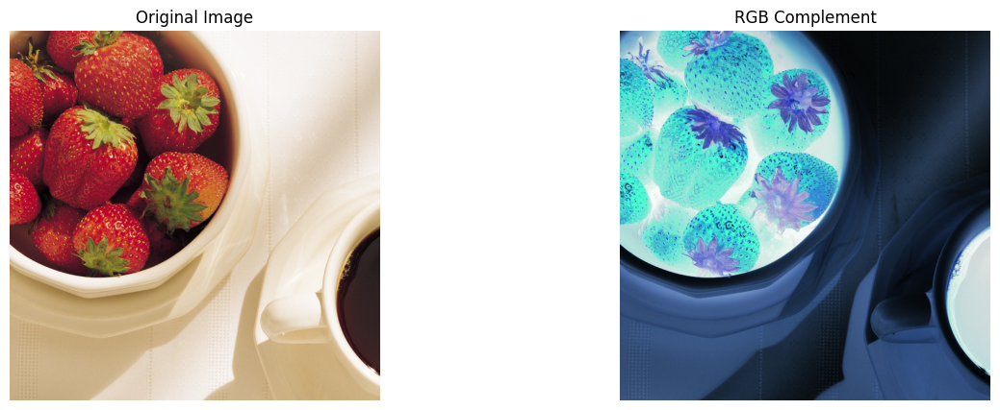

In [47]:
import cv2
import numpy as np

img = cv2.imread('Images/Fig0630(01)(strawberries_fullcolor).tif')

# RGB Complement (built-in)
rgb_comp = cv2.bitwise_not(img)
# Show
show_images([img, rgb_comp], 
            ["Original Image", "RGB Complement"])


## **Color Slicing (Hyperspace Thresholding)**

**Concept:**
Color slicing highlights a specific color range in an image while suppressing all other colors, often by mapping the unselected colors to a neutral gray or black. This is vital for tasks like object recognition or quality control (e.g., isolating a defect of a specific color).

The target colors are defined by a region in the 3D RGB color space: a **Cube** or a **Sphere**.

### **1. Cube Slicing (Hypercube)**
This method selects colors where **all** three components (R, G, and B) fall within a specified range around a central color $(a_1, a_2, a_3)$.

**Formula (Cube Slicing):**
We keep the pixel color $(r_i)$ if every component $j$ is within $\pm W/2$ of the center $a_j$. Otherwise, map the color to a neutral gray (0.5, 0.5, 0.5).

$$
s_i =
\begin{cases}
0.5 & \text{if } \left[|r_j - a_j| > \frac{W}{2}\right]_{\text{any } 1 \le j \le n} \\
r_i & \text{otherwise}
\end{cases}
\quad i = 1, 2, \dots, n
$$

### **2. Sphere Slicing**
This method selects colors where the **distance** from the center color is less than a fixed radius $R_0$. This is generally more effective than the cube because it defines a smoother boundary around the target color.

**Formula (Sphere Slicing):**
We keep the pixel color $(r_i)$ if the Euclidean distance squared is less than $R_0^2$.

$$
s_i =
\begin{cases}
0.5 & \text{if } \sum_{j=1}^{n} (r_j - a_j)^2 > R_0^2 \\
r_i & \text{otherwise}
\end{cases}
\quad i = 1, 2, \dots, n
$$
where $R_0$ is the radius of the sphere.

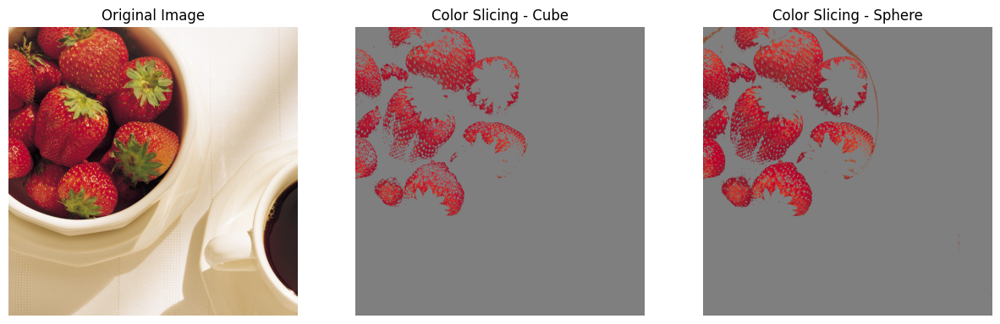

In [ ]:
original_image = cv2.imread('Images/Fig0630(01)(strawberries_fullcolor).tif')

# Make a single RGB pixel with your chosen values
rgb_color = np.array([[[0.1922, 0.1608, 0.6863]]], dtype=float)

cube_width = 0.2549
sphere_radius = 0.1765

def color_slicing_cube(image,width,color):
  image = image / 255
  diff = np.abs(image - color)
  mask = np.any(diff > (width / 2), axis=-1, keepdims=True)
  output_image = np.where(mask, 0.5, image)
  # This is true but in above code we make simpler it
  # output_image = np.where((np.any(np.abs(image - color) > (width / 2), axis = -1, keepdims = True)),0.5,image)
  return output_image * 255

def color_slicing_sphere(image,radius,color):
  image = image / 255
  diff = np.power((image - color),2)
  mask = np.any(diff > np.power(radius,2), axis = -1, keepdims = True)
  output_image = np.where(mask,0.5,image)
  return output_image * 255

cube = color_slicing_cube(original_image,cube_width,rgb_color)
sphere = color_slicing_sphere(original_image,sphere_radius,rgb_color)

# Show
show_images([original_image, cube.astype(np.uint8), sphere.astype(np.uint8)],["Original Image", "Color Slicing - Cube", "Color Slicing - Sphere"])

## **Tone and Color Corrections**

### **1. Tone Correction (Adjusting Brightness and Contrast)**

**Concept:**
Tone correction is the critical first step in color processing. It ensures the image's overall brightness distribution (tonal range) is balanced before addressing specific color casts. Images can be **Light (High-Key)**, **Dark (Low-Key)**, or **Flat** (lacking contrast).

**Goal:**
To use nonlinear color transformations to shift the image's current tonal distribution closer to the desired **Middle-Key** range, thereby expanding contrast in the darks (for Low-Key images) or compressing highlights (for High-Key images).

**Method (Power-Law Transformation):**
Tone correction is achieved by applying a power-law transformation (gamma correction) equally to the R, G, and B components. This preserves the hue and saturation while changing intensity.

**Transformation Function:**
$$s_i = c \cdot r_i^\gamma$$

**For Dark Images (Low-Key):** We use $\gamma < 1$ (e.g., $\gamma = 0.5$). This maps the dark input values to brighter output values, revealing shadow detail.<br>
**For Light Images (High-Key):** We use $\gamma > 1$ (e.g., $\gamma = 2.0$). This compresses the highlights and darkens the midtones/shadows.

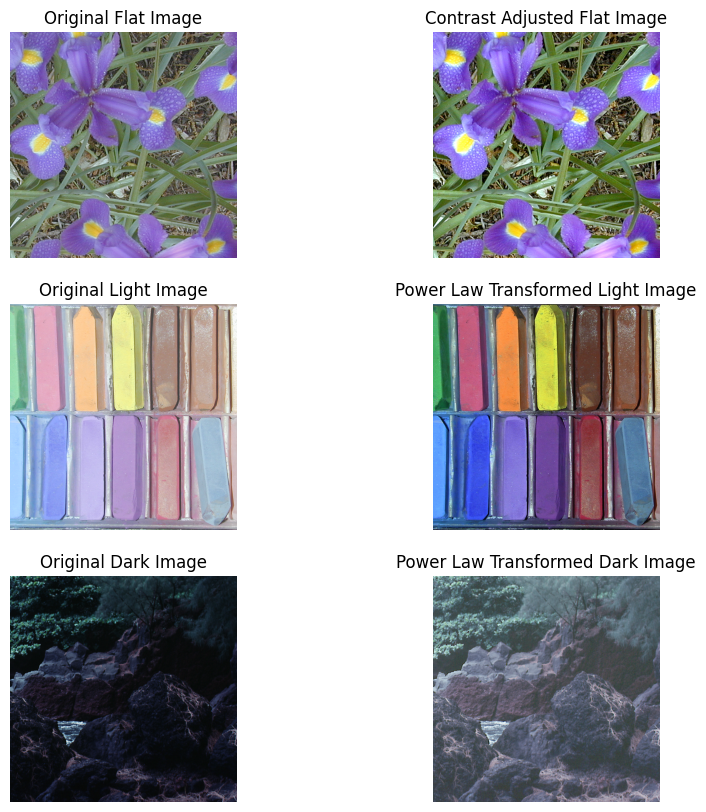

In [11]:
def contrast_adjusting(image, fact):
    # Convert to float
    img = image.astype(np.float32)

    # Compute global mean per channel
    mean = cv2.mean(img)[:3]    # returns (mean_b, mean_g, mean_r, extra_value), so we select on first three

    # Subtract mean → cv2.subtract
    centered = cv2.subtract(img, np.array(mean, dtype=np.float32))

    # Multiply contrast → cv2.multiply
    scaled = cv2.multiply(centered, fact)

    # Add mean back → cv2.add
    adjusted = cv2.add(scaled, np.array(mean, dtype=np.float32))

    return np.clip(adjusted, 0, 255).astype(np.uint8)


def power_law(image,gamma):
  image = image / 255
  output_image = np.zeros_like(image)
  for dim in range(3):
    output_image[:,:,dim] = np.power(image[:,:,dim],gamma)

  output_image = np.clip(output_image,0,1)
  return output_image * 255


flat_image = cv2.imread('Images/Fig0635(top_ left_flower).tif')
light_image = cv2.imread('Images/Fig0635(middle_row_left_chalk ).tif')
dark_image = cv2.imread('Images/Fig0635(bottom_left_stream).tif')

flat_image = flat_image.astype(np.float64)
flat_trans = contrast_adjusting(flat_image, 1.5).astype(flat_image.dtype)
light_trans = power_law(light_image,2.5).astype(light_image.dtype)
dark_trans = power_law(dark_image,0.4).astype(dark_image.dtype)

# Show

plt.figure(figsize=(10,10))
plt.subplot(3,2,1)
plt.imshow(cv2.cvtColor(flat_image.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title("Original Flat Image")
plt.axis('off')
plt.subplot(3,2,2)
plt.imshow(cv2.cvtColor(flat_trans.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title("Contrast Adjusted Flat Image")
plt.axis('off')

plt.subplot(3,2,3)
plt.imshow(cv2.cvtColor(light_image.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title("Original Light Image")
plt.axis('off')
plt.subplot(3,2,4)
plt.imshow(cv2.cvtColor(light_trans.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title("Power Law Transformed Light Image")
plt.axis('off')

plt.subplot(3,2,5)
plt.imshow(cv2.cvtColor(dark_image.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title("Original Dark Image")
plt.axis('off')
plt.subplot(3,2,6)
plt.imshow(cv2.cvtColor(dark_trans.astype(np.uint8), cv2.COLOR_BGR2RGB))
plt.title("Power Law Transformed Dark Image")
plt.axis('off')

plt.show()

## **2. Color Correction (Fixing Color Casts)**

**Concept:**
Color Correction addresses an imbalance in the ratio of color components (a "color cast"). This is typically needed when lighting is poor (e.g., fluorescent or warm indoor lighting).

**Principle of Complements:**
Based on the additive color wheel (RGB and its complements Cyan, Magenta, Yellow - CMY).
* To increase a color (e.g., Red), you can **decrease** its opposite (Cyan) or **increase** its two adjacent primaries (Green and Blue).

**Practical Example:**
If an image is **Heavy in Cyan** (meaning it lacks Red), you correct it by **increasing Red** or **decreasing Cyan** (which is done by adding Blue and Green).

**Implementation:**
This is achieved by applying separate nonlinear transformations (like S-curves) to the individual R, G, or B channels based on the color cast observed.

In [12]:
# These functions are not defined in OpenCV, so we implement them manually

def rgb_to_cmy(img):
    return 255 - img

def cmy_to_cmyk(cmy):
    cmy = cmy.astype(np.float32) / 255
    K = np.min(cmy, axis=-1, keepdims=True)

    C = (cmy - K) / (1 - K + 1e-6)
    CMYK = np.concatenate((C, K), axis=-1)
    return (CMYK * 255).astype(np.uint8)

def cmyk_to_cmy(cmyk):
    cmyk = cmyk.astype(np.float32) / 255
    C = cmyk[..., :3]
    K = cmyk[..., 3:]
    CMY = C * (1 - K) + K
    return (CMY * 255).astype(np.uint8)

def cmy_to_rgb(cmy):
    return 255 - cmy

def power_law(x, gamma):
    x = x.astype(np.float32) / 255
    return np.clip(x ** gamma, 0, 1) * 255

In [13]:
img = cv2.imread('Images/Fig0636(woman_baby_original).tif')

# ---- Convert to CMYK ----
cmy  = rgb_to_cmy(img)
cmyk = cmy_to_cmyk(cmy)

def vary_channel(cmyk_img, ch_index, gamma_heavy, gamma_weak):
    out_heavy = cmyk_img.copy()
    out_weak  = cmyk_img.copy()

    out_heavy[..., ch_index] = power_law(cmyk_img[..., ch_index], gamma_heavy)
    out_weak[...,  ch_index] = power_law(cmyk_img[..., ch_index], gamma_weak)

    rgb_heavy = cmy_to_rgb(cmyk_to_cmy(out_heavy))
    rgb_weak  = cmy_to_rgb(cmyk_to_cmy(out_weak))

    return rgb_heavy, rgb_weak


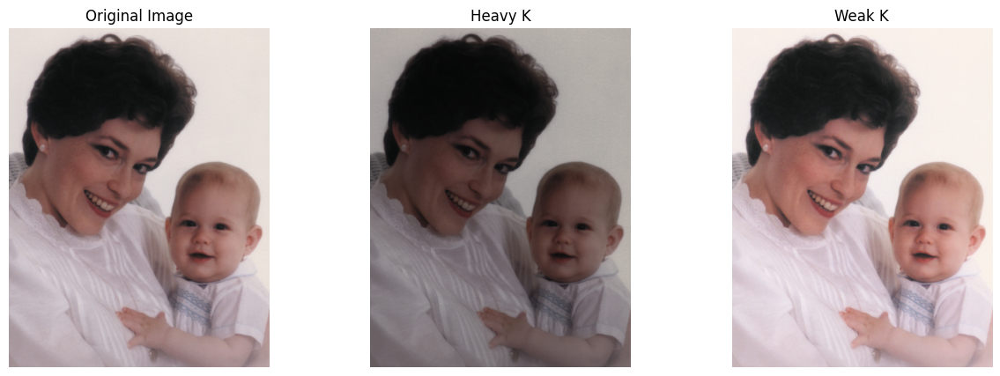

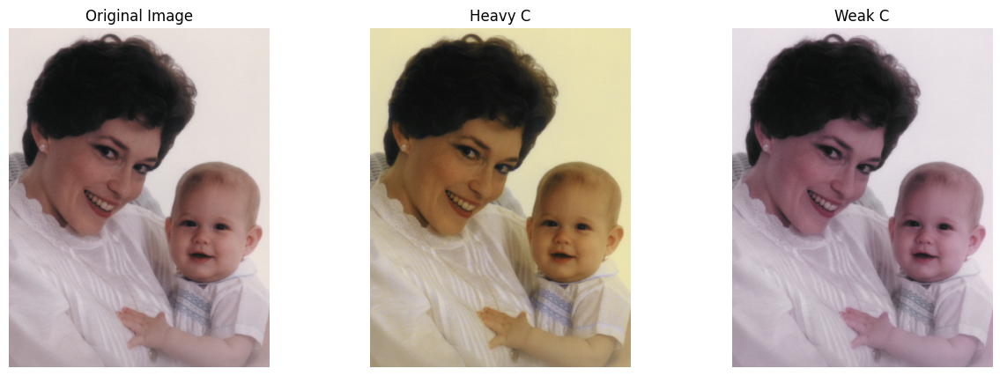

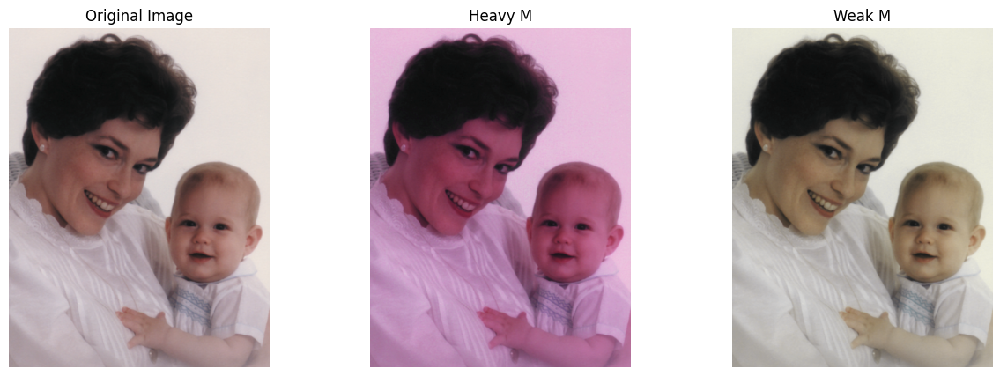

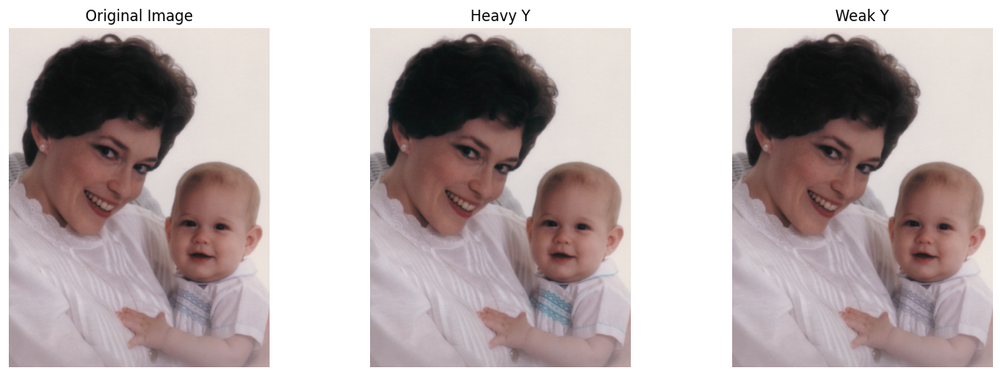

In [14]:
# h -> heavy, w -> weak
# Vary K: (Black)
h1, w1 = vary_channel(cmyk, 3, gamma_heavy=0.5, gamma_weak=1.5)

# Vary C:
h2, w2 = vary_channel(cmyk, 0, gamma_heavy=0.5, gamma_weak=1.5)

# Vary M:
h3, w3 = vary_channel(cmyk, 1, gamma_heavy=0.5, gamma_weak=1.5)

# Vary Y:
h4, w4 = vary_channel(cmyk, 2, gamma_heavy=0.5, gamma_weak=1.5)

# Show
show_images([img, h1, w1], ["Original Image", "Heavy K", "Weak K"])
show_images([img, h2, w2], ["Original Image", "Heavy C", "Weak C"])
show_images([img, h3, w3], ["Original Image", "Heavy M", "Weak M"])
show_images([img, h4, w4], ["Original Image", "Heavy Y", "Weak Y"])


## **Histogram Processing (Color Images)**

**The Problem with RGB Equalization:**
Color images are composed of three or more components (e.g., R, G, B). If we apply standard Histogram Equalization independently to *each* RGB plane, it often results in two undesirable effects:
1.  **Color Casts:** The equalization process drastically alters the R:G:B ratios, which changes the Hue. For instance, the image might end up with an unnatural green or blue tint.
2.  **Loss of Relationship:** It destroys the essential chromatic relationship between the R, G, and B components that define the original color.

**The Solution: The HSI Approach**
A more robust and perceptually accurate method is to use the HSI color model, which decouples brightness from color:

1.  **Hue (H) and Saturation (S):** These channels define the *color* itself. They should be left **unchanged** to preserve the original appearance.
2.  **Intensity (I):** This channel defines the *brightness* or contrast. We apply **Histogram Equalization only to the I channel**.

**Result:**
The contrast and dynamic range are maximized (due to the I-channel equalization) while the colors (Hue and Saturation) remain faithful to the original image.

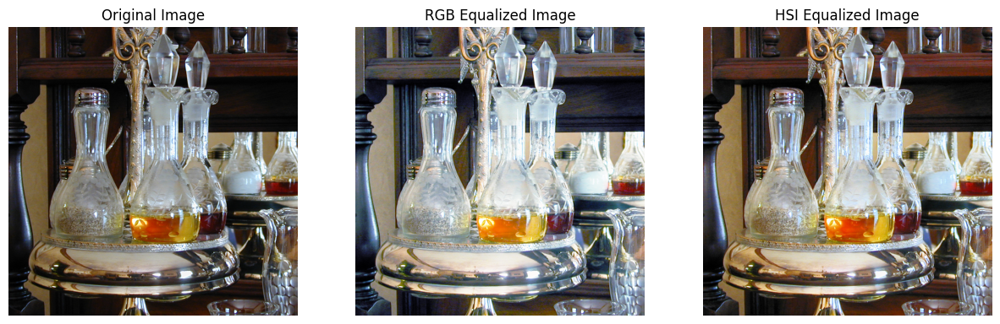

In [15]:
original_image = cv2.imread('Images/Fig0637(a)(caster_stand_original).tif')

# Histogram Equalization in RGB Color Space
B, G, R = cv2.split(original_image)
R_eq = cv2.equalizeHist(R)
G_eq = cv2.equalizeHist(G)
B_eq = cv2.equalizeHist(B)
rgb_eq = cv2.merge([B_eq, G_eq, R_eq])

# Convert to HSV (OpenCV built-in)
hsi = cv2.cvtColor(original_image, cv2.COLOR_BGR2HSV)

h, s, i = cv2.split(hsi)
v_eq = cv2.equalizeHist(i)  # built-in histogram equalization

hsi_eq = cv2.merge([h, s, v_eq])
hsi_eq = cv2.cvtColor(hsi_eq, cv2.COLOR_HSV2BGR)

# Show
show_images([original_image, rgb_eq, hsi_eq], ["Original Image", "RGB Equalized Image", "HSI Equalized Image"])

## **Color Image Smoothing**

**Concept:**
Smoothing (or blurring) is done to reduce noise and suppress fine detail using a neighborhood average. For a color image, we must consider the color components as a vector $\mathbf{C}$.

**The Core Principle:**
Color image smoothing simplifies to performing the exact same averaging operation independently on each of the Red, Green, and Blue planes.

**Vector Averaging:**
The average of the RGB component vector $\mathbf{C}(x, y)$ in a neighborhood $S_{xy}$ of size $K$ is:
$$\bar{\mathbf{C}} = \frac{1}{K} \sum_{(x,y) \in S_{xy}} \mathbf{C}(x, y)$$

**Component-wise Simplification:**
Since $\mathbf{C}$ is a vector of components $[R, G, B]^T$, the average vector $\bar{\mathbf{C}}$ breaks down into:

$$
\bar{\mathbf{C}} =
\begin{bmatrix}
\frac{1}{K} \sum_{(x,y) \in S_{xy}} R(x,y) \\
\frac{1}{K} \sum_{(x,y) \in S_{xy}} G(x,y) \\
\frac{1}{K} \sum_{(x,y) \in S_{xy}} B(x,y)
\end{bmatrix}
$$

**Conclusion:** Smoothing by neighborhood averaging can be carried out on a **per color plane basis** . We simply apply the standard grayscale averaging filter to the R, G, and B images separately, and then recombine them. However we can also carry out the smoothing process on only the intensity channel of HSI model.

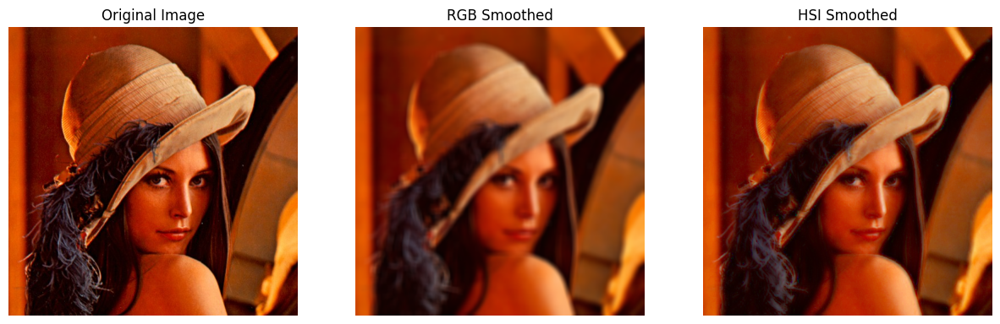

In [17]:
def smooth_rgb(image, k_size):
    return cv2.blur(image, (k_size, k_size))

def smooth_hsi(image, k_size):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    v_blur = cv2.blur(v, (k_size, k_size))  # smooth intensity
    hsv_blur = cv2.merge([h, s, v_blur])
    return cv2.cvtColor(hsv_blur, cv2.COLOR_HSV2BGR)

original_image = cv2.imread('Images/Fig0638(a)(lenna_RGB).tif')

rgb_blur = smooth_rgb(original_image, 11)
hsi_blur = smooth_hsi(original_image, 11)

# Show
show_images([original_image, rgb_blur, hsi_blur], ["Original Image", "RGB Smoothed", "HSI Smoothed"])

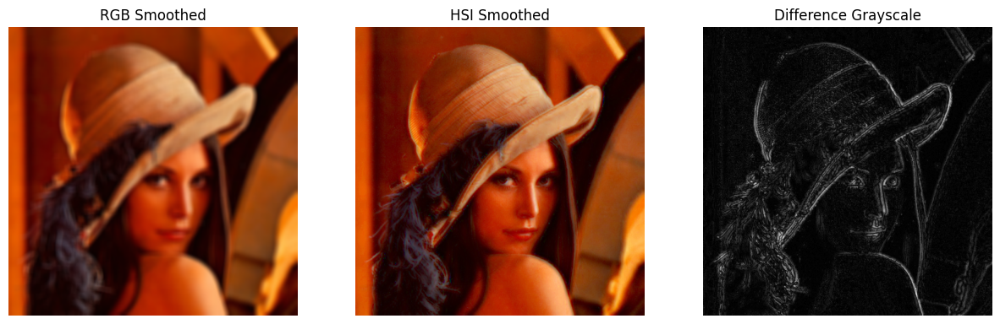

In [18]:
# Their Difference

diff_rgb = cv2.absdiff(rgb_blur, hsi_blur)
difference_grayscale = cv2.cvtColor(diff_rgb, cv2.COLOR_BGR2GRAY)

# Show
show_images([rgb_blur, hsi_blur, difference_grayscale], ["RGB Smoothed", "HSI Smoothed", "Difference Grayscale"])

## **Color Image Sharpening**

**Concept:**
Image sharpening is achieved by using spatial filtering kernels (like the Laplacian) that highlight abrupt changes in intensity (edges). For color images, this operation is treated as a **vector operation**.

**The Principle of Vector Laplacian:**
From vector analysis, the Laplacian ($\nabla^2$) of a color vector $\mathbf{c}$ is a vector whose components are equal to the Laplacian of the individual scalar color components ($R$, $G$, and $B$).

**Mathematical Formula:**
$$
\nabla^2 \mathbf{c}(x, y) =
\begin{bmatrix}
\nabla^2 R(x,y) \\
\nabla^2 G(x,y) \\
\nabla^2 B(x,y)
\end{bmatrix}
$$

**Conclusion:** To sharpen a full-color image, we simply compute the Laplacian of each component image separately and then recombine them.

**Common Sharpening Kernel (Laplacian with Enhancement):**
The following 3x3 kernel is frequently used because the central value ($+9$) enhances the sharp result while the surrounding negative values preserve the original low-frequency intensity values, resulting in a cleaner sharpened image.

$$
\begin{bmatrix}
-1 & -1 & -1 \\
-1 & 9 & -1 \\
-1 & -1 & -1
\end{bmatrix}
$$

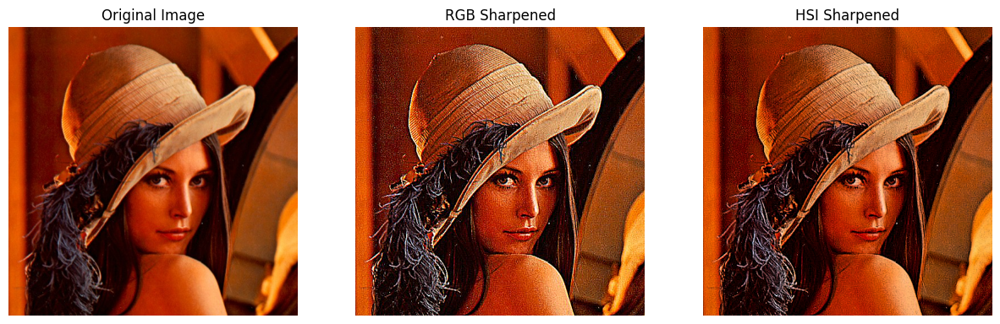

In [19]:
def sharp_rgb(image, kernel):
    # Apply the kernel to each channel
    return cv2.filter2D(image, -1, kernel)


def sharp_hsi(image, kernel):
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)
    
    v_sharp = cv2.filter2D(v, -1, kernel)  # add original intensity back
    v_sharp = np.clip(v_sharp, 0, 255).astype(np.uint8)
    
    hsv_sharp = cv2.merge([h, s, v_sharp])
    return cv2.cvtColor(hsv_sharp, cv2.COLOR_HSV2BGR)


original_image = cv2.imread('Images/Fig0638(a)(lenna_RGB).tif')
kernel = np.array([[-1,-1,-1],
                   [-1, 9,-1],
                   [-1,-1,-1]], dtype=np.float32)

rgb_sharp = sharp_rgb(original_image, kernel)
hsi_sharp = sharp_hsi(original_image, kernel)

# Show
show_images([original_image, rgb_sharp, hsi_sharp], ["Original Image", "RGB Sharpened", "HSI Sharpened"])


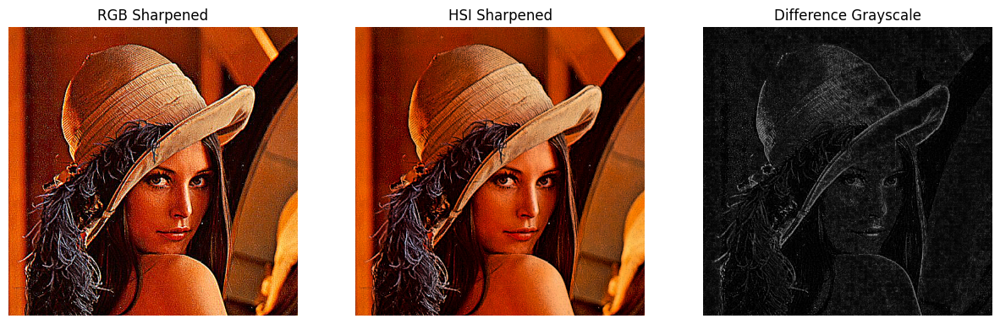

In [20]:
# Now their Difference

diff_rgb = cv2.absdiff(rgb_sharp, hsi_sharp)
difference_grayscale = cv2.cvtColor(diff_rgb, cv2.COLOR_BGR2GRAY)
# Show
show_images([rgb_sharp, hsi_sharp, difference_grayscale], ["RGB Sharpened", "HSI Sharpened", "Difference Grayscale"])

## **Noise in Color Images**

**Concept:**
Noise in a color image can be modeled in the same way as in grayscale images. We usually assume the noise is added independently to each color channel (R, G, and B).

**Noise Removal in RGB Space:**
If the noise characteristics (e.g., mean and variance of Gaussian noise) are the same across all three channels, noise is easily removed by applying smoothing filters (like Gaussian, Average, or Median) **independently to each R, G, and B plane** and then recombining them.

**The Problem: Noise Spread During Conversion**
The complex, nonlinear mathematical operations required to convert RGB to HSI (especially the trigonometric functions for Hue and the division/minimum functions for Saturation) cause the noise to spread and amplify, severely degrading the H and S channels.

**Key Observations :**
* **Hue (H) and Saturation (S):** These channels become significantly degraded because the noise is passed through the highly sensitive $\cos^{-1}$ and $\min$ operations. Even a small amount of Gaussian noise in RGB can translate into severe degradation in H and S.
* **Intensity (I):** This channel is relatively smoother than the individual R, G, or B channels. This is because Intensity is calculated as the simple average of the three noisy channels ($I = \frac{1}{3}(R+G+B)$), and averaging is a form of low-pass (smoothing) filter.

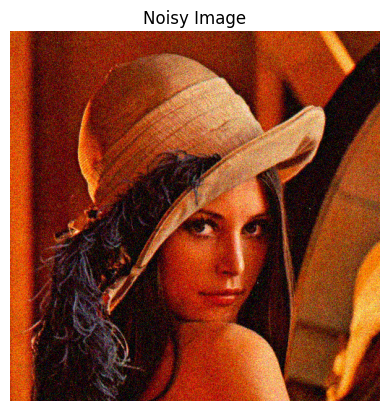

In [21]:
image = cv2.imread('Images/Fig0638(a)(lenna_RGB).tif')
# Generate Gaussian noise
gauss = np.random.normal(0, 25, size = image.shape).astype(np.float32)
    
# Add noise and clip to [0, 255]
noisy_image = np.clip(image.astype(np.float32) + gauss, 0, 255).astype(np.uint8)

plt.imshow(noisy_image[..., ::-1])   # Convert BGR→RGB for Matplotlib
plt.title("Noisy Image")
plt.axis('off')
plt.show()


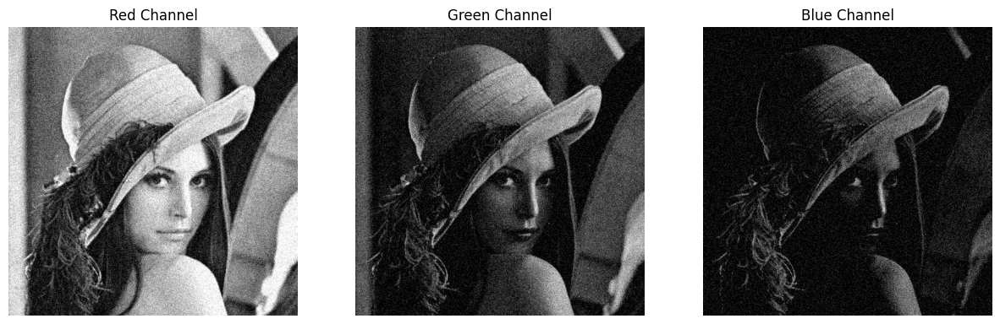

In [22]:
# Show R, G, B channels of the noisy image
B, G, R = cv2.split(noisy_image)
show_images([R, G, B], ["Red Channel", "Green Channel", "Blue Channel"])

C:\Users\asadu\AppData\Local\Temp\ipykernel_2680\3612863990.py:21: RuntimeWarning: divide by zero encountered in divide
  s = (1 - (3 / denominator) * min_rgb) * 255
C:\Users\asadu\AppData\Local\Temp\ipykernel_2680\3612863990.py:21: RuntimeWarning: invalid value encountered in multiply
  s = (1 - (3 / denominator) * min_rgb) * 255


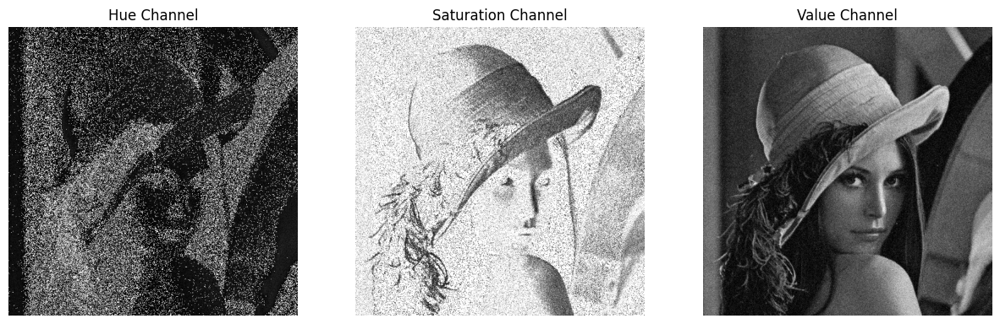

In [28]:
# Convert to HSI

H, S, I = rgb2hsi(noisy_image)

# Show
show_images([H, S, I], ["Hue Channel", "Saturation Channel", "Value Channel"])

## **Color Image Compression**

**Concept:**
Compression is the vital process of reducing or eliminating **redundant and/or irrelevant information** from a digital image. Since color images contain three times the data of grayscale images, compression is even more critical.

**Motivation (Bandwidth & Storage):**
The primary motivation is efficiency. A compressed image requires significantly less data to store or transmit. The lecture example highlights this dramatic reduction:
> "In case if in a compressed image 1 bit of data represents 230 bits of data in the original image, then compressed image could be transmitted over internet in 1 minute as compared to original image which will take 4 hours to transmit."

**The Process:**
A compressed image file is not directly viewable. It must undergo two steps:
1.  **Compression:** (Encoding) Reducing the file size using algorithms like JPEG or JPEG 2000.
2.  **Decompression:** (Decoding) Reconstructing the image data for display on a monitor.

**Key Requirement:**
Ideally, the result after compressing and decompressing the image should be visually indistinguishable from the original, especially for high-quality formats like JPEG 2000.

Original (uncompressed) size: 5760000 bytes
Compressed JPEG size (quality=5): 39158 bytes
Compression ratio: 147.09637877317533


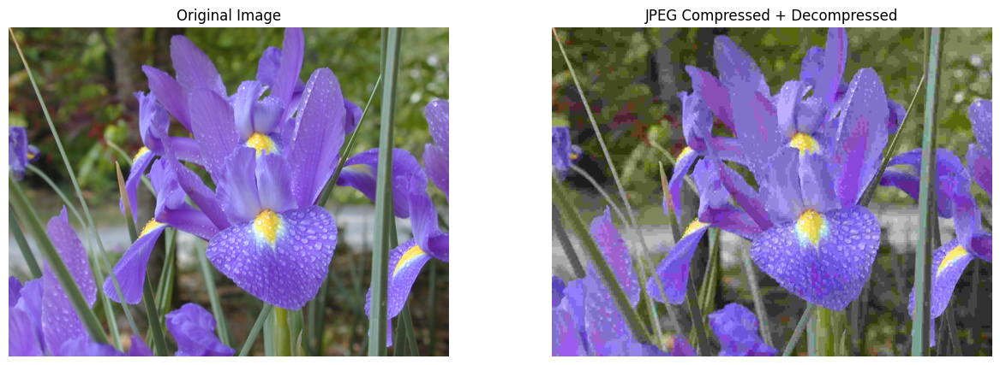

In [36]:
import cv2

# 1. Read image
img = cv2.imread('Images/Fig0651(a)(flower_no_compression).tif')

# 2. Set JPEG compression quality (0 = worst, 100 = best)
quality = 5

# 3. Compress the image into JPEG format (stored in memory, not saved to disk)
success, compressed_buffer = cv2.imencode('.jpg', img, 
                                          [cv2.IMWRITE_JPEG_QUALITY, quality])

# 4. If compression worked, decode the JPEG bytes back into an image
if success:
    decompressed = cv2.imdecode(compressed_buffer, cv2.IMREAD_COLOR)
    compressed_bytes = compressed_buffer.size
else:
    print("Compression failed.")
    decompressed = img.copy()
    compressed_bytes = 0

# 5. Print comparison
if compressed_bytes > 0:
    print("Original (uncompressed) size:", img.size, "bytes")
    print(f"Compressed JPEG size (quality={quality}):", compressed_bytes, "bytes")
    print("Compression ratio:", img.size / compressed_bytes)

# 6. Display
show_images(
    [img, decompressed],
    ["Original Image", "JPEG Compressed + Decompressed"]
)
